In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Transforming to a 2d coordinate system
df = pd.read_csv('images/mnist.csv')
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [3]:
from sklearn.model_selection import train_test_split

In [4]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2, random_state=42)

In [5]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)

In [6]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [7]:
X_train_trf

array([[-226.60561264,  305.89533912],
       [  38.33546952, -461.07783234],
       [-305.49222073, -351.66489088],
       ...,
       [ -28.00174816,  596.09129151],
       [ 233.96953271,   18.62438378],
       [1096.50389733, -254.75815887]])

In [8]:
import plotly.express as px

In [9]:
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                y=X_train_trf[:,1],
                color=y_train_trf,
                color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

In [10]:
# Transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [11]:
X_train_trf

array([[-226.60692323,  305.88779046,  417.17758667],
       [  38.33343534, -461.10761917,  100.3989652 ],
       [-305.49101955, -351.67023901, -961.34898876],
       ...,
       [ -28.00529055,  596.04460138,  606.25521043],
       [ 233.97199672,   18.65777011, -148.27418259],
       [1096.50564402, -254.72041764, -560.34642902]])

In [12]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1],z=X_train_trf[:,2],
                   color=y_train_trf)
fig.update_layout(
        margin=dict(l=20, r=20, t=20, b=20)
)
fig.show()

In [13]:
pca.explained_variance_
# Eigen value

array([335506.57620103, 244807.10500963, 212051.03449407])

In [14]:
pca.components_
# Eigen vectors

array([[ 1.48164006e-19, -1.67232988e-19, -9.77147104e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-1.09015193e-16,  4.78651675e-18, -2.24951794e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-6.14440030e-19,  3.54890761e-17,  2.00810924e-17, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [15]:
pca.components_.shape

(3, 784)

In [16]:
pca.explained_variance_ratio_*100 # convert in percentage

array([9.77072202, 7.12934512, 6.17541312])

In [17]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [19]:
pca.explained_variance_.shape

(784,)

In [20]:
pca.components_.shape

(784, 784)

In [22]:
np.cumsum(pca.explained_variance_ratio_)

array([0.09770722, 0.16900067, 0.2307548 , 0.28465032, 0.33357585,
       0.37694429, 0.40971003, 0.43863706, 0.46634409, 0.4896358 ,
       0.51056687, 0.53103851, 0.54811645, 0.56494851, 0.58079573,
       0.59567555, 0.60890653, 0.6217459 , 0.63357974, 0.6450916 ,
       0.65585129, 0.66609344, 0.6757597 , 0.68493267, 0.69377981,
       0.70211509, 0.7102658 , 0.71801912, 0.72543898, 0.73237223,
       0.73898072, 0.74531281, 0.75134494, 0.75723224, 0.76285054,
       0.76824915, 0.77332825, 0.77819952, 0.78291205, 0.78755761,
       0.79208251, 0.7965231 , 0.80068828, 0.80464464, 0.80848068,
       0.81221196, 0.815819  , 0.81930765, 0.82264965, 0.82582976,
       0.82897181, 0.83204415, 0.83496782, 0.83783336, 0.84062454,
       0.84331783, 0.84596712, 0.84853351, 0.85106204, 0.85351457,
       0.85592008, 0.85831105, 0.86057999, 0.86279635, 0.8649424 ,
       0.86700054, 0.86901774, 0.87098082, 0.87291702, 0.87479944,
       0.87665559, 0.87847316, 0.88022525, 0.88195105, 0.88360

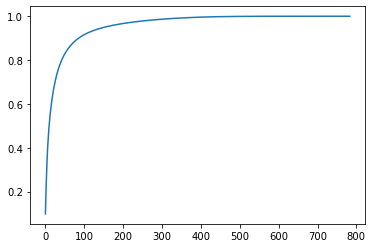

In [23]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))